In [1]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
# 데이터 불러오기
df = pd.read_csv('data/Churn_Modelling.csv')

# 불필요한 컬럼 제거
df = df.drop(['RowNumber', 'CustomerId', 'Surname','CreditScore','Tenure','HasCrCard','EstimatedSalary'], axis=1)

# 연속형 변수들을 로그 스케일링 실시 ('Age','Balance')
df['LogAge'] = df['Age'].apply(lambda x: np.log1p(x))
df['LogBalance'] = df['Balance'].apply(lambda x: np.log1p(x))

# 타겟과 피처 분리
X = df.drop(['Exited', 'Balance', 'Age'], axis=1)
y = df['Exited']

# 범주형 변수 인코딩 (LightGBM은 LabelEncoder, CatBoost는 인덱스 지정)
from sklearn.preprocessing import LabelEncoder
X_enc = X.copy()
for col in ['Geography', 'Gender']:
    le = LabelEncoder()
    X_enc[col] = le.fit_transform(X_enc[col])

# 학습/테스트 분할
X_train, X_test, y_train, y_test = train_test_split(X_enc, y, test_size=0.2, random_state=42, stratify=y)



In [2]:
import lightgbm as lgb
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from scipy.stats import randint, uniform

# 1차: RandomizedSearchCV
param_dist = {
    'n_estimators': randint(100, 1000),
    'max_depth': randint(3, 10),
    'learning_rate': uniform(0.01, 0.2),
    'num_leaves': randint(20, 100)
}
lgb_model = lgb.LGBMClassifier(random_state=42)
random_search = RandomizedSearchCV(
    lgb_model, param_distributions=param_dist, n_iter=30, cv=3, scoring='f1', random_state=42, n_jobs=-1
)
random_search.fit(X_train, y_train)
print("LightGBM 1차 Best Params:", random_search.best_params_)

# 2차: GridSearchCV (1차 결과 기반)
best_params = random_search.best_params_
param_grid = {
    'n_estimators': [best_params['n_estimators']-50, best_params['n_estimators'], best_params['n_estimators']+50],
    'max_depth': [best_params['max_depth']-1, best_params['max_depth'], best_params['max_depth']+1],
    'learning_rate': [best_params['learning_rate']*0.8, best_params['learning_rate'], best_params['learning_rate']*1.2],
    'num_leaves': [best_params['num_leaves']-10, best_params['num_leaves'], best_params['num_leaves']+10]
}
grid_search = GridSearchCV(
    lgb_model, param_grid=param_grid, cv=3, scoring='f1', n_jobs=-1
)
grid_search.fit(X_train, y_train)
print("LightGBM 최종 Best Params:", grid_search.best_params_)


[LightGBM] [Info] Number of positive: 1087, number of negative: 4246
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 332
[LightGBM] [Info] Number of data points in the train set: 5333, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.203825 -> initscore=-1.362556
[LightGBM] [Info] Start training from score -1.362556
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

In [3]:
from sklearn.metrics import classification_report, roc_auc_score

# LightGBM 최적 모델
lgb_best = grid_search.best_estimator_
y_pred_lgb = lgb_best.predict(X_test)
y_proba_lgb = lgb_best.predict_proba(X_test)[:,1]
print("LightGBM Classification Report:\n", classification_report(y_test, y_pred_lgb))
print("LightGBM ROC AUC:", roc_auc_score(y_test, y_proba_lgb))

LightGBM Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.96      0.92      1593
           1       0.75      0.50      0.60       407

    accuracy                           0.86      2000
   macro avg       0.81      0.73      0.76      2000
weighted avg       0.85      0.86      0.85      2000

LightGBM ROC AUC: 0.8555728301491012


In [4]:
from sklearn.metrics import confusion_matrix
print("LightGBM Confusion Matrix:\n", confusion_matrix(y_test, y_pred_lgb))

LightGBM Confusion Matrix:
 [[1525   68]
 [ 205  202]]


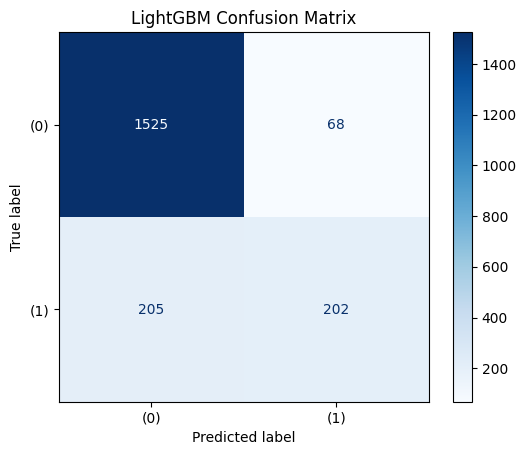

In [5]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# LightGBM
cm_lgb = confusion_matrix(y_test, y_pred_lgb)
disp_lgb = ConfusionMatrixDisplay(confusion_matrix=cm_lgb, display_labels=["(0)", "(1)"])
disp_lgb.plot(cmap='Blues')
plt.title("LightGBM Confusion Matrix")
plt.show()


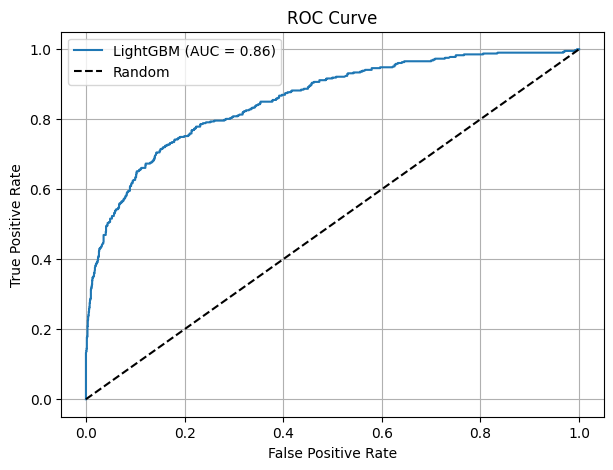

In [6]:
from sklearn.metrics import roc_curve, auc

# LightGBM
fpr_lgb, tpr_lgb, _ = roc_curve(y_test, y_proba_lgb)
roc_auc_lgb = auc(fpr_lgb, tpr_lgb)


plt.figure(figsize=(7,5))
plt.plot(fpr_lgb, tpr_lgb, label=f'LightGBM (AUC = {roc_auc_lgb:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.grid()
plt.show()

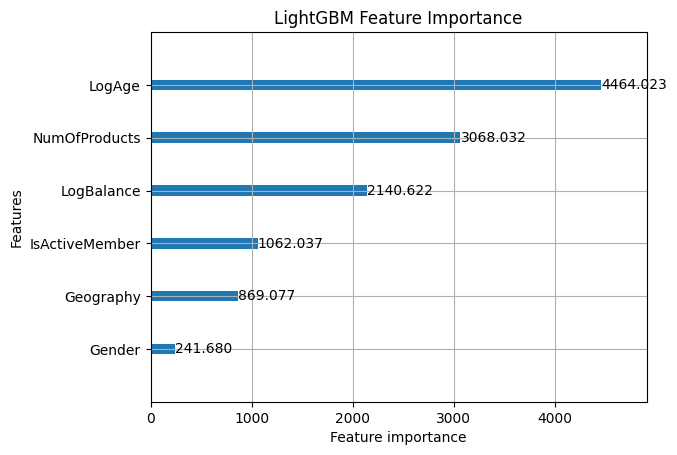

In [7]:
import lightgbm as lgb
lgb.plot_importance(lgb_best, max_num_features=10, importance_type='gain')
plt.title('LightGBM Feature Importance')
plt.show()

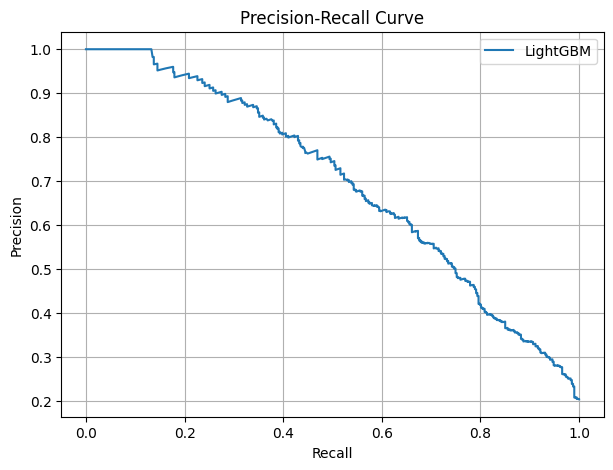

In [8]:
from sklearn.metrics import precision_recall_curve

precision_lgb, recall_lgb, _ = precision_recall_curve(y_test, y_proba_lgb)


plt.figure(figsize=(7,5))
plt.plot(recall_lgb, precision_lgb, label='LightGBM')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.grid()
plt.show()